# Fusion paper story line (with both Model3 and Model4 in parallel)

This script demonstrates the logical sequence of the results section in fusion paper with only considering independent arrangemnet model + VMF emission model combination, which refers to Model 3 (common kappa) and Model 4 (separate kappas) for short.

## 1. Improving individual maps by integrating group prior

In [23]:
import sys
sys.path.append("..")
from ProbabilisticParcellation.scripts.evaluate_da import *
from ProbabilisticParcellation.util import *
from Functional_Fusion.dataset import * 
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd

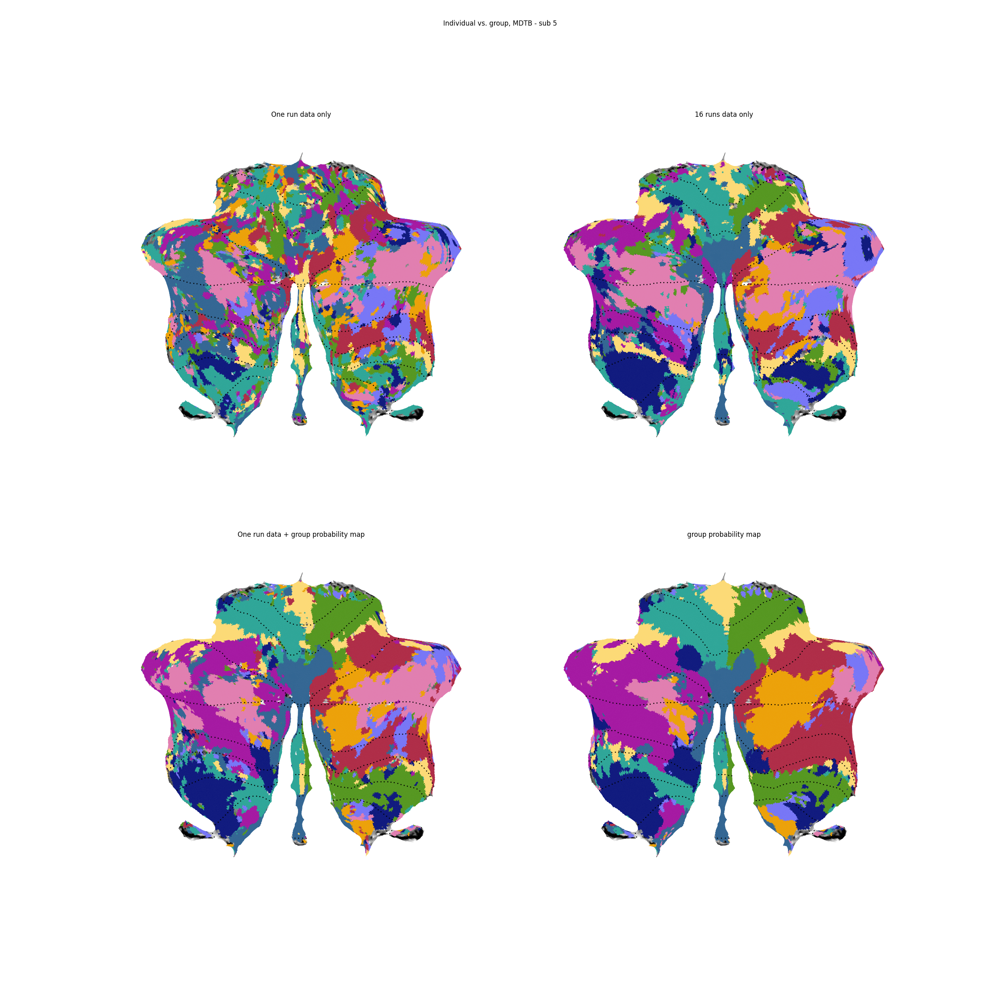

In [4]:
from IPython import display

img = model_dir + f'/Results/1.indiv_vs_group/subject_plots/indiv_group_plot_sub_5.png'
display.Image(img)

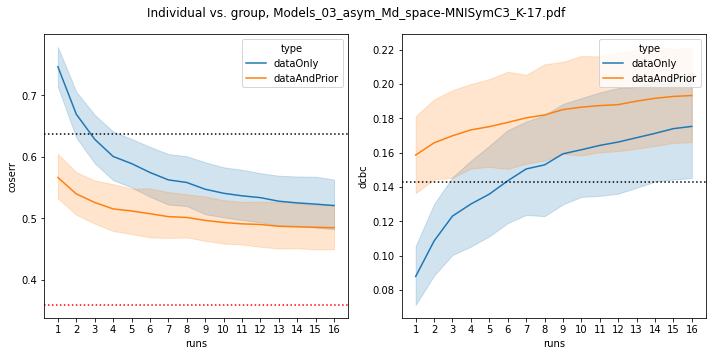

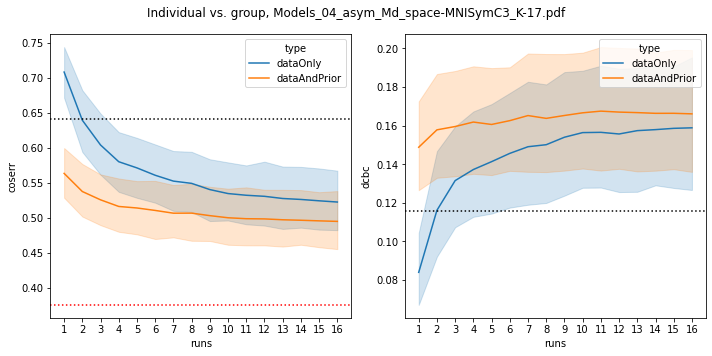

In [5]:
model_type = 'Models_03'
model_name = 'asym_Md_space-MNISymC3_K-17'
fname = model_dir + f'/Results/1.indiv_vs_group/eval_{model_type}_{model_name}.tsv'
result_1_plot_curve(fname, oname=model_type + f'_{model_name}.pdf')

model_type = 'Models_04'
model_name = 'asym_Md_space-MNISymC3_K-17'
fname = model_dir + f'/Results/1.indiv_vs_group/eval_{model_type}_{model_name}.tsv'
result_1_plot_curve(fname, oname=model_type + f'_{model_name}.pdf')

## 2. Simulation - The proposed model does fusion on two synthetic datasets

In this section, we want to testify the framework can do fusion through the synthetic datasets in two scenarios, (a) the synthetic datasets are relevant (like two imaging datasets that all emphasis the motor tasks), and (b) the synthetic datasets are irrelevant (like one motor dataset and one language dataset). Then we validate and compare the model fusion results in these two types.

The options to present: 1. To simulate two datasets fusion without considering relevant/irrelevant; 2. with considering relevant/irrelevant.

### Option 1: Without considering the datasets to be fused are relevant or irrelevant domain.

#### In this simulation, the protion of two relevant sessions and two irrelevant sessions are 50%-50%. In each protion, I set two variants: 

(1) Relevant - signal strengh of good and bad parcels are both 1.1 but the sigma squared are [0.5, 0.8] (two relatively noisy relevant sessions) and [0.2, 0.5] (one good and one bad relevant sessions). 

(2) Irrelevant - the signal strength for good parcels are all 1.1 and the bad ones are set to 0.1. But the sigma squared of the parcels are set to [0.2, 0.2] (two relatively not noisy irrelavant sessions) and [0.8, 0.8] (two relatively noisy irrelavant sessions).

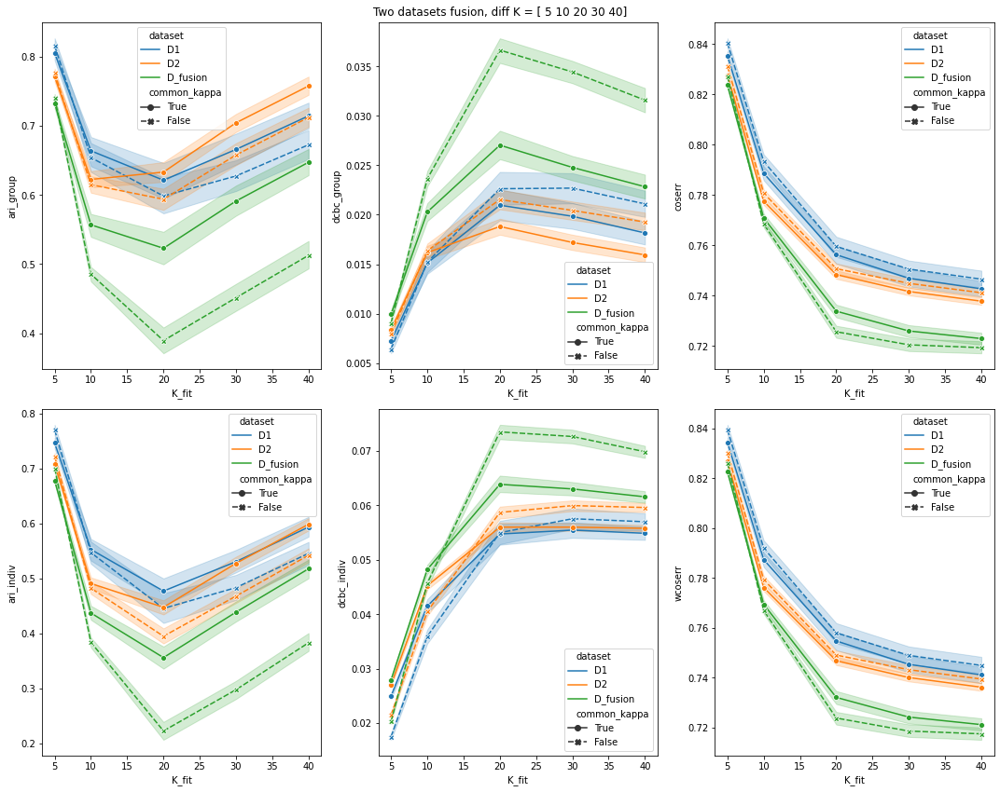

In [26]:
def _plot_diffK(D, hue="dataset", style=None, title=None):
    # D = D.loc[D.common_kappa == True]
    plt.figure(figsize=(15,12))
    crits = ['ari_group','dcbc_group','coserr',
             'ari_indiv','dcbc_indiv','wcoserr']
    for i, c in enumerate(crits):
        plt.subplot(2, 3, i + 1)
        if style is not None:
            sb.lineplot(data=D, x="K_fit", y=c, hue=hue, hue_order=['D1','D2','D_fusion'], style=style,
                        style_order=D[style].unique(),markers=True)
        else:
            sb.lineplot(data=D, x="K_fit", y=c, hue=hue, hue_order=['D1','D2','D_fusion'], markers=True)
    
    if title is not None:
        plt.suptitle(title)
    else:
        plt.suptitle(f'Two datasets fusion, diff K = {D.K_fit.unique()}')
    plt.tight_layout()
    plt.show()

fname = model_dir + f'/Results/2.simulation/eval_Ktrue_20_Kfit_5to40_all_models.tsv'
D = pd.read_csv(fname, delimiter='\t')

_plot_diffK(D, style="common_kappa")

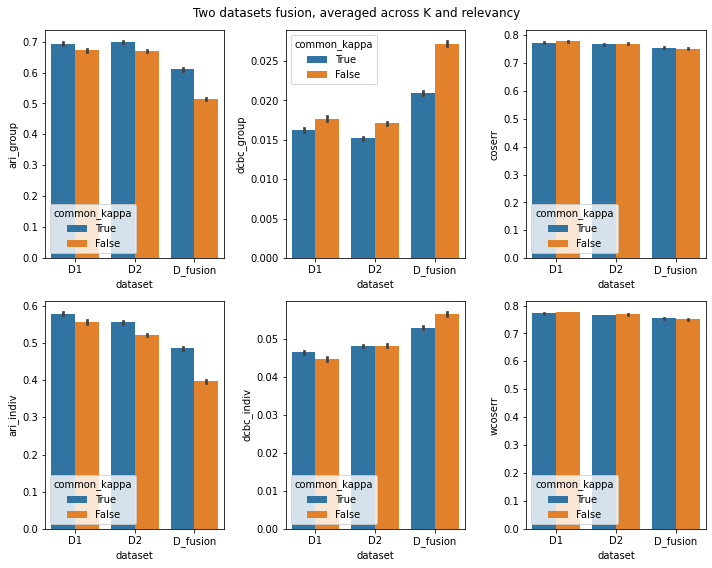

In [35]:
def _plot_bar(D, title=None):
    # D = D.loc[D.common_kappa == True]
    plt.figure(figsize=(10,8))
    crits = ['ari_group','dcbc_group','coserr',
             'ari_indiv','dcbc_indiv','wcoserr']
    for i, c in enumerate(crits):
        plt.subplot(2, 3, i + 1)
        sb.barplot(data=D, x="dataset", y=c, hue='common_kappa', hue_order=[True,False], errorbar="se")
    
    if title is not None:
        plt.suptitle(title)
    else:
        plt.suptitle(f'Two datasets fusion, averaged across K and relevancy')
    plt.tight_layout()
    plt.show()

fname = model_dir + f'/Results/2.simulation/eval_Ktrue_20_Kfit_5to40.tsv'
D = pd.read_csv(fname, delimiter='\t')
_plot_bar(D)

### Option 2: With considering relevant or irrelevant domain.

**Model 3: Fusion always work when the two datasets are relevant** but **fusion doesn't work when the two sessions are irrelavant**

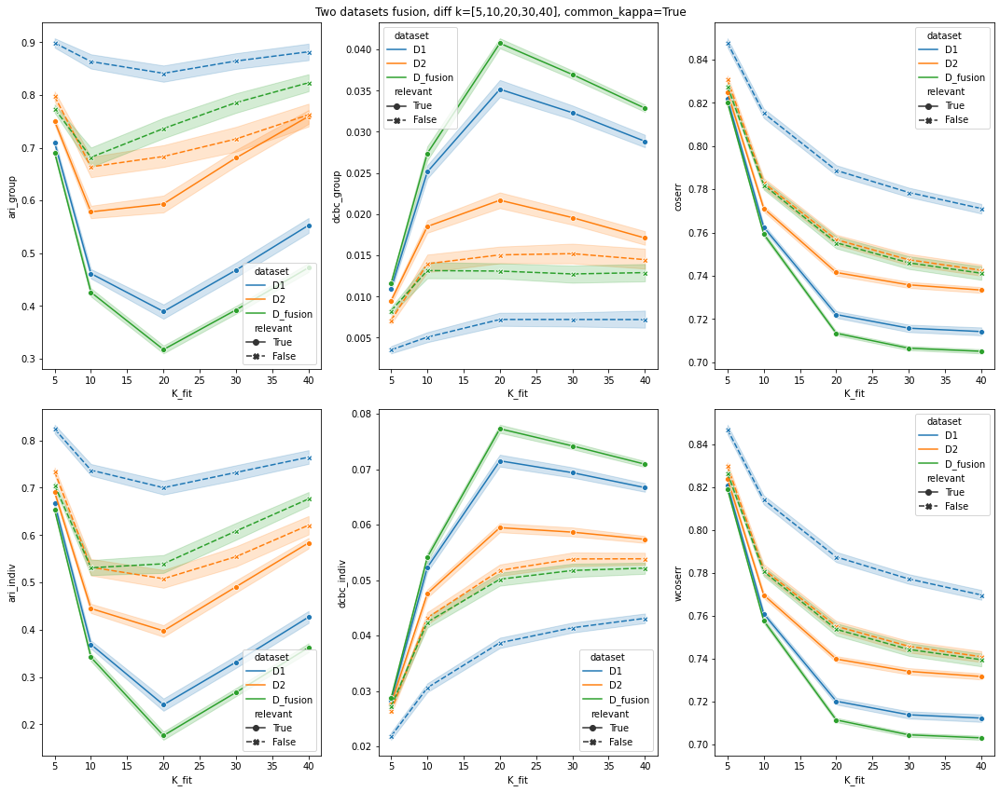

In [18]:
fname = model_dir + f'/Results/2.simulation/eval_Ktrue_20_Kfit_5to40.tsv'
D = pd.read_csv(fname, delimiter='\t')
D = D.loc[D['common_kappa']==True]
_plot_diffK(D, style="relevant", title='Two datasets fusion, diff k=[5,10,20,30,40], common_kappa=True')

**Model 4: Fusion always work whenever the two datasets are relevant or irrelevant**

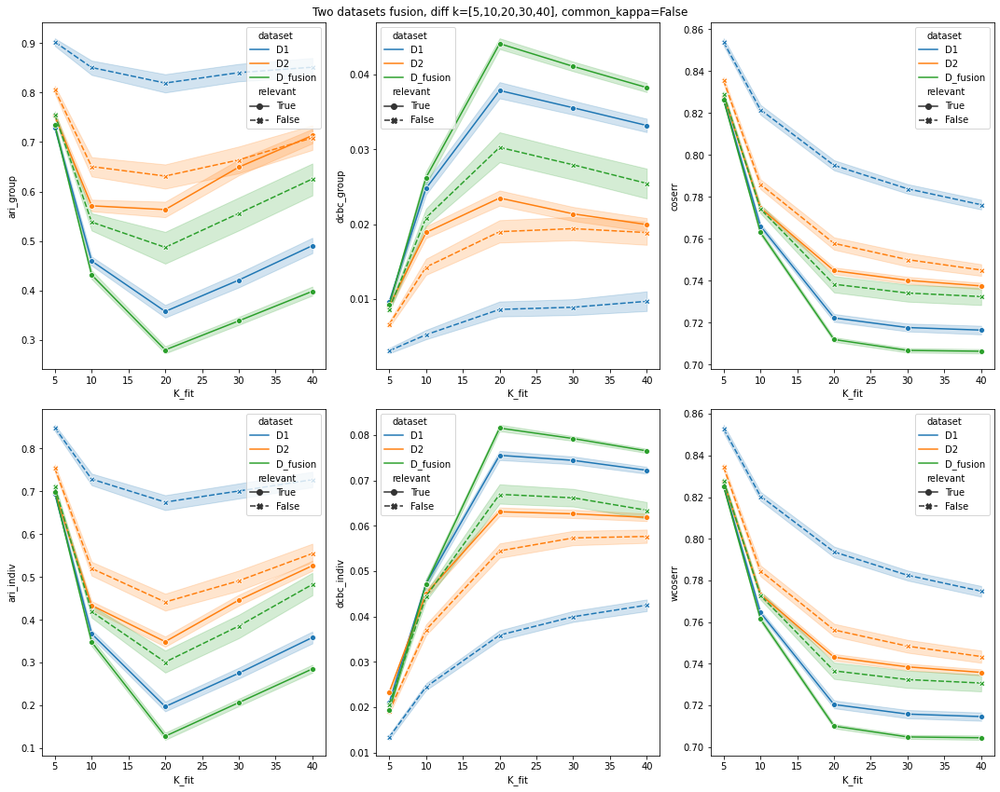

In [19]:
fname = model_dir + f'/Results/2.simulation/eval_Ktrue_20_Kfit_5to40.tsv'
D = pd.read_csv(fname, delimiter='\t')
D = D.loc[D['common_kappa']==False]
_plot_diffK(D, style="relevant", title='Two datasets fusion, diff k=[5,10,20,30,40], common_kappa=False')

### (Example) Two relevant datasets fusion

In [32]:
%%capture
from generativeMRF.notebooks.simulate_fusion import *
grid, U, U_prior, U_indv, Props, _, _ = do_sessFusion_diffK(K_true=10, K=10, M=np.array([40, 20]), 
                                                            nsubj_list=np.array([10, 10]), num_part=1,
                                                            width=50, low=1.1, high=1.1, sigma2=[0.5,0.8],
                                                            plot_trueU=False, relevant=True)

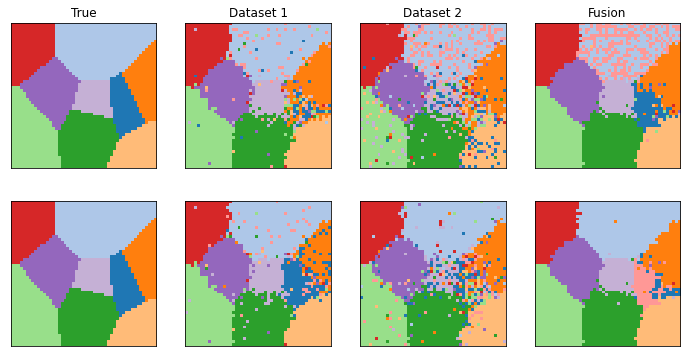

In [33]:
names = ["True", "Dataset 1", "Dataset 2", "Fusion"]

plt.figure(figsize=(12,6))
plt.subplot(2, 4, 1)
grid.plot_maps(pt.argmax(U_prior[0], dim=0))
plt.title(names[0])
plt.ylabel('model 3')
plt.subplot(2, 4, 2)
grid.plot_maps(pt.argmax(Props[0][0, :, :], dim=0))
plt.title(names[1])
plt.subplot(2, 4, 3)
grid.plot_maps(pt.argmax(Props[0][1, :, :], dim=0))
plt.title(names[2])
plt.subplot(2, 4, 4)
grid.plot_maps(pt.argmax(Props[0][2, :, :], dim=0))
plt.title(names[3])

plt.subplot(2, 4, 5)
grid.plot_maps(pt.argmax(U_prior[0], dim=0))
plt.ylabel('model 4')
plt.subplot(2, 4, 6)
grid.plot_maps(pt.argmax(Props[1][0, :, :], dim=0))
plt.subplot(2, 4, 7)
grid.plot_maps(pt.argmax(Props[1][1, :, :], dim=0))
plt.subplot(2, 4, 8)
grid.plot_maps(pt.argmax(Props[1][2, :, :], dim=0))

plt.show()

### (Example) Two irrelevant datasets fusion

In [37]:
%%capture
from generativeMRF.notebooks.simulate_fusion import *

# inits = np.array([820, 443, 188, 305, 717])
grid, U, U_prior, U_indv, Props, _, _ = do_sessFusion_diffK(K_true=10, K=10, M=np.array([40, 20]), 
                                                            nsubj_list=np.array([10, 10]), num_part=1,
                                                            width=50, low=0.1, high=1.1, sigma2=[0.2,0.2],
                                                            plot_trueU=False, relevant=False)

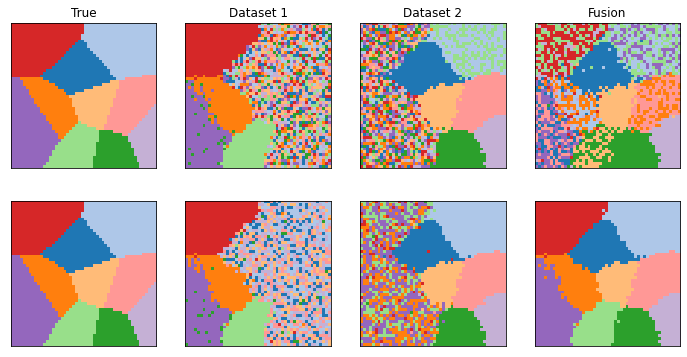

In [38]:
names = ["True", "Dataset 1", "Dataset 2", "Fusion"]

plt.figure(figsize=(12,6))
plt.subplot(2, 4, 1)
grid.plot_maps(pt.argmax(U_prior[0], dim=0))
plt.title(names[0])
plt.subplot(2, 4, 2)
grid.plot_maps(pt.argmax(Props[0][0, :, :], dim=0))
plt.title(names[1])
plt.subplot(2, 4, 3)
grid.plot_maps(pt.argmax(Props[0][1, :, :], dim=0))
plt.title(names[2])
plt.subplot(2, 4, 4)
grid.plot_maps(pt.argmax(Props[0][2, :, :], dim=0))
plt.title(names[3])

plt.subplot(2, 4, 5)
grid.plot_maps(pt.argmax(U_prior[0], dim=0))
plt.subplot(2, 4, 6)
grid.plot_maps(pt.argmax(Props[1][0, :, :], dim=0))
plt.subplot(2, 4, 7)
grid.plot_maps(pt.argmax(Props[1][1, :, :], dim=0))
plt.subplot(2, 4, 8)
grid.plot_maps(pt.argmax(Props[1][2, :, :], dim=0))

plt.show()

### Further comparison of Model 3 and 4 on the ROIs of fusion and the good datasets of two irrelevant datasets

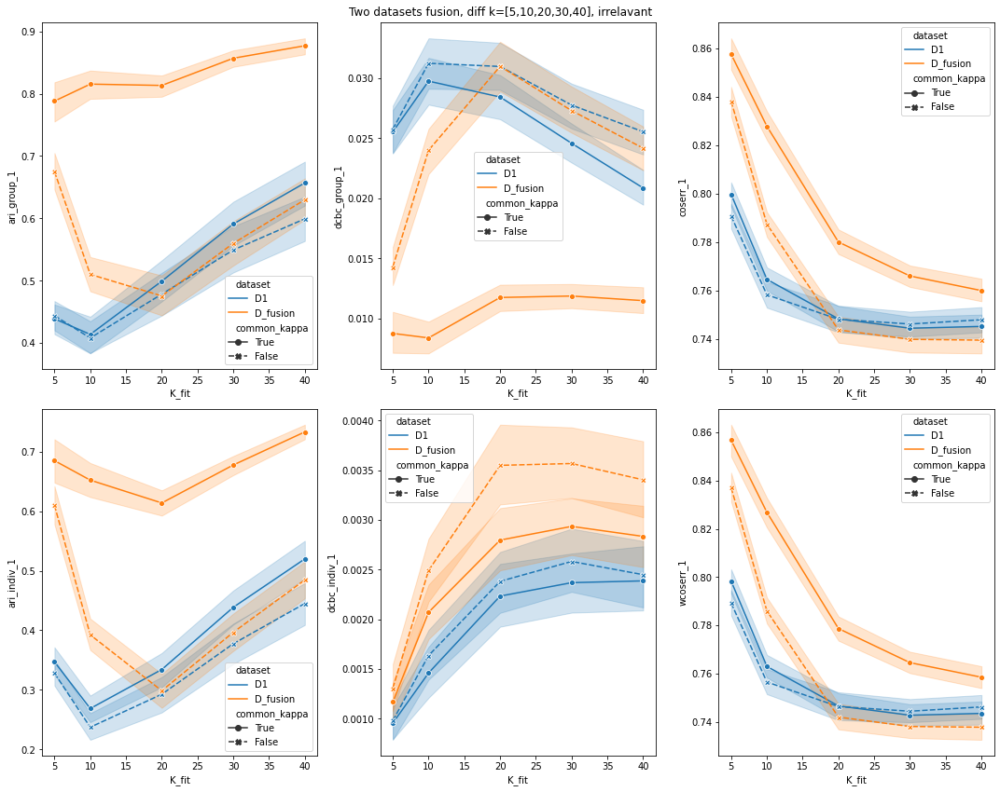

In [44]:
def _plot_diffK_ROI(D, dataset=1, hue="dataset", style=None, title=None):
    # D = D.loc[D.common_kappa == True]
    plt.figure(figsize=(15,12))
    crits = ['ari_group','dcbc_group','coserr',
             'ari_indiv','dcbc_indiv','wcoserr']
    crits = [f'{i}_{dataset}' for i in crits]
    
    for i, c in enumerate(crits):
        plt.subplot(2, 3, i + 1)
        if style is not None:
            sb.lineplot(data=D, x="K_fit", y=c, hue=hue, hue_order=[f'D{dataset}', 'D_fusion'], style=style,
                        style_order=D[style].unique(),markers=True)
        else:
            sb.lineplot(data=D, x="K_fit", y=c, hue=hue, markers=True)
    
    if title is not None:
        plt.suptitle(title)
    else:
        plt.suptitle(f'Two datasets fusion, diff K = {D.K_fit.unique()}')
    plt.tight_layout()
    plt.show()

fname = model_dir + f'/Results/2.simulation/eval_Ktrue_20_Kfit_5to40.tsv'
D = pd.read_csv(fname, delimiter='\t')
D = D.loc[D['relevant']==False]
_plot_diffK_ROI(D, dataset=1, style="common_kappa", 
                title='Two datasets fusion, diff k=[5,10,20,30,40], irrelavant')

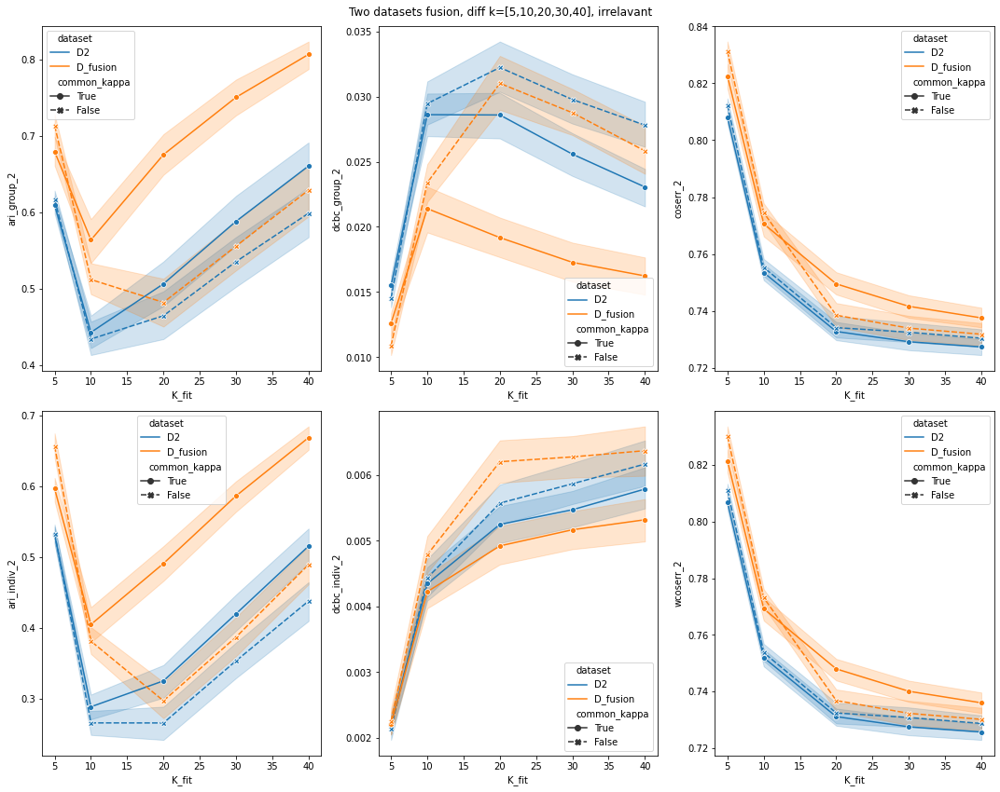

In [45]:
fname = model_dir + f'/Results/2.simulation/eval_Ktrue_20_Kfit_5to40.tsv'
D = pd.read_csv(fname, delimiter='\t')
D = D.loc[D['relevant']==False]
_plot_diffK_ROI(D, dataset=2, style="common_kappa", 
                title='Two datasets fusion, diff k=[5,10,20,30,40], irrelavant')

### Simulation conclusion

Model 4 always do fusion no matter the two datasets are relevant or irrelevant, while model 3 only show strong evidence in two relevant datasets fusion but sometimes failed in two irrelevant datsets fusion.

## 3. Confirm the simulation on real datasets (IBC 14 sessions)

D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')
D:\python_workspace\Functional_Fusion\dataset.py:217: RuntimeWarning: invalid value encountered in true_divide
  r[s,pn,:] = nansum(X1*X2,axis=0)/ \


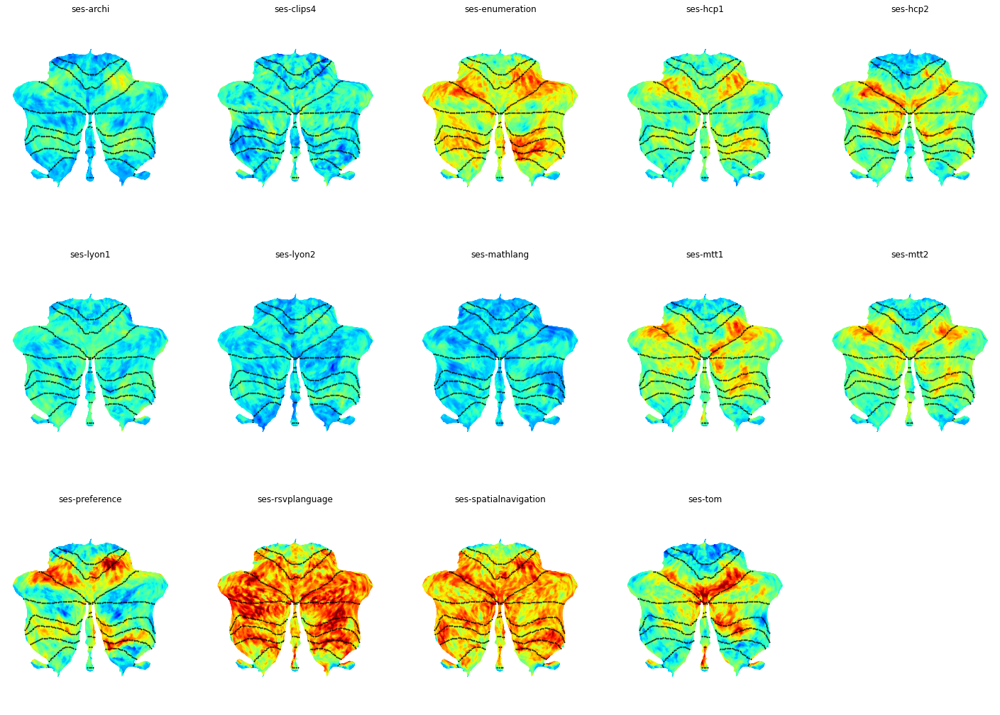

In [21]:
rel, sess = reliability_maps(base_dir, 'IBC', subtract_mean=False, voxel_wise=True)
plt.figure(figsize=(25, 18))
plot_multi_flat(rel, 'MNISymC3', grid=(3, 5), dtype='func',
                cscale=[-0.3, 0.7], colorbar=False, titles=sess)

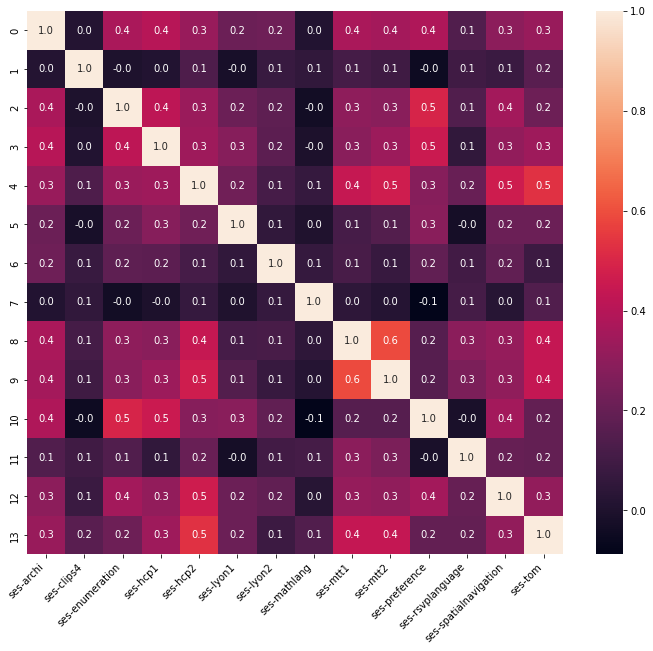

In [27]:
# 1. Get session-similarity between all 14 seesions
rel, sess = reliability_maps(base_dir, 'IBC', subtract_mean=False, voxel_wise=True)
ses_cor = np.corrcoef(rel)

plt.figure(figsize=(12,10))
ax = sb.heatmap(ses_cor, annot=True, fmt=".1f")
a = ax.set_xticklabels(sess, rotation=45,horizontalalignment='right')

### (Correspond to option 1) The two sessions fusion - without relevant/irrelevant

In general, both model 3 and model 4 can do fusion, this also replicate the simulation result. 

**Parcellation**
Model 3 outperforms model 4 in generating group parcellation (dcbc_group) and individual parcellation (dcbc_indiv) in K = [10, 68] but potentially suboptimal with larger K.

**Functional localizer**
First, the fusion maps from both model 3 and 4 show better performance compared to any single datasets as a functional localizer. Second, the model 4 slightly outperforms model 3 with increasing K in the group map, while model 3 consistently better than model 4 in terms of individual localizer.

D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')
D:\python_workspace\Functional_Fusion\dataset.py:217: RuntimeWarning: invalid value encountered in true_divide
  r[s,pn,:] = nansum(X1*X2,axis=0)/ \
D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')


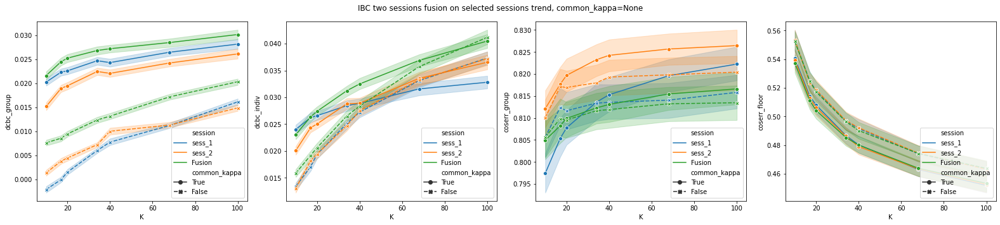

In [33]:
from ProbabilisticParcellation.scripts.modeling_3 import *
fname = f'/Models/Evaluation/eval_asym_train-Ib_twoSess_test-leftOutSess.tsv'
# result_3_rel_check(fname)
result_3_plot(fname, style="common_kappa", style_order=[True, False])

### (Correspond to option 2) The two sessions fusion - triaged by relevant/irrelevant

In general, both model 3 and model 4 can do fusion in two relevant datasets fusion, but model 3 cannot do fusion in two irrelevant datasets. this also replicate the simulation result. 

**Relevant sessions**

**Parcellation** Model 3 outperforms model 4 in generating group parcellation (dcbc_group) and individual parcellation (dcbc_indiv) in K = [10, 68) but suboptimal with larger K (K=68).

**Functional localizer**First, the fusion maps from both model 3 and 4 show better performance compared to any single datasets as a functional localizer. Second, the model 3 consistently better than model 4 in terms of individual localizer.

D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')
D:\python_workspace\Functional_Fusion\dataset.py:217: RuntimeWarning: invalid value encountered in true_divide
  r[s,pn,:] = nansum(X1*X2,axis=0)/ \
D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')


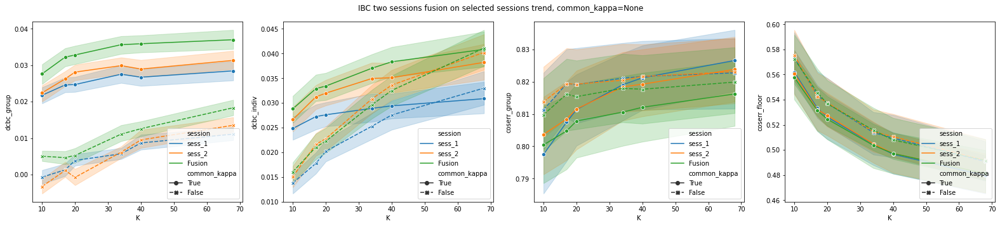

In [2]:
import warnings
warnings.filterwarnings('ignore')

from ProbabilisticParcellation.scripts.modeling_3 import *
fname = f'/Models/Evaluation/eval_asym_train-Ib_twoSess_test-leftOutSess.tsv'
result_3_plot(fname, style='common_kappa', style_order=[True, False], relevant=True)

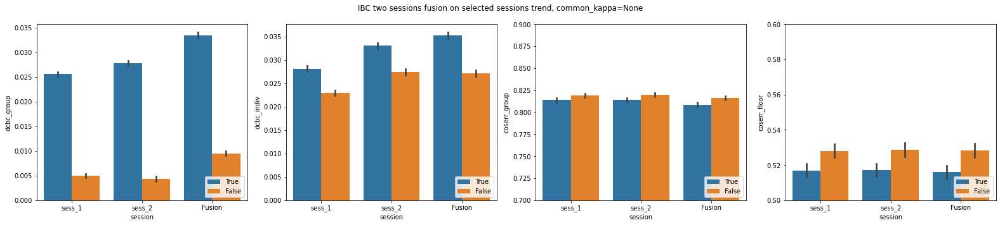

In [1]:
import warnings
warnings.filterwarnings('ignore')

from ProbabilisticParcellation.scripts.modeling_3 import *
fname = f'/Models/Evaluation/eval_asym_train-Ib_twoSess_test-leftOutSess.tsv'
result_3_plot(fname, style='common_kappa', style_order=[True, False], relevant=True)

**Irrelevant sessions**

**Parcellation** Model 3 outperforms model 4 in generating group parcellation (dcbc_group) and individual parcellation (dcbc_indiv) in K = [10, 68] but potentially suboptimal with larger K.

**Functional localizer**First, the fusion maps from both model 3 and 4 show better performance compared to any single datasets as a functional localizer. Second, the model 4 slightly outperforms model 4 with increasing K in the group map, while model 3 consistently better than model 4 in terms of individual localizer.

D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')
D:\python_workspace\Functional_Fusion\dataset.py:217: RuntimeWarning: invalid value encountered in true_divide
  r[s,pn,:] = nansum(X1*X2,axis=0)/ \
D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')


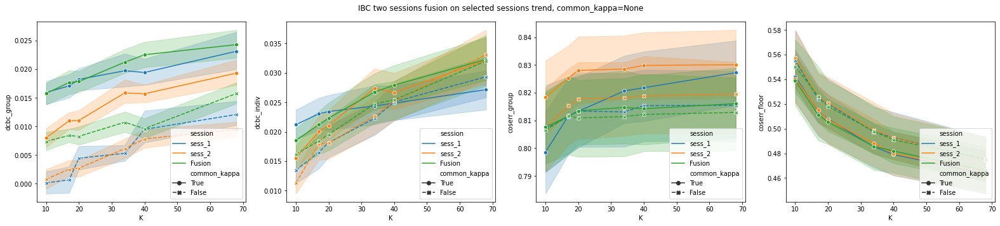

In [3]:
import warnings
warnings.filterwarnings('ignore')

from ProbabilisticParcellation.scripts.modeling_3 import *
fname = f'/Models/Evaluation/eval_asym_train-Ib_twoSess_test-leftOutSess.tsv'
result_3_plot(fname, style='common_kappa', style_order=[True, False], relevant=False)

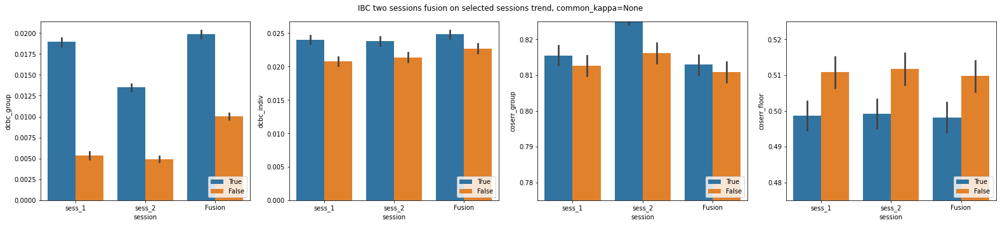

In [1]:
import warnings
warnings.filterwarnings('ignore')

from ProbabilisticParcellation.scripts.modeling_3 import *
fname = f'/Models/Evaluation/eval_asym_train-Ib_twoSess_test-leftOutSess.tsv'
result_3_plot(fname, style='common_kappa', style_order=[True, False], relevant=False)

### The session performance is not correlated to session reliability (Show this if anyone asked)

Sometime, we thought a good session should also perform well in terms of evaluation metric or parcellation quality. To testify this assumption, we classified IBC individual sessions quiality by their reliability (the within-subject correlation across runs in each session). A higher reliability value indicates this is a good session. Here we plot the relationship between reliability value of sessions with the session performance (evaluation metrics). And the plot shows that the session reliability is nothing to do with its performance. **This is also the evidence that why sometimes the `sess_1` higher or below `sess_2`, or there's a cross in the evaluation graph.**

D:\python_workspace\Functional_Fusion\dataset.py:390: UserWarning: sub-11, ses-preference, CondHalf - missing data painting_constant-half2
  warnings.warn(f'{s}, {ses_id}, {type} - missing data {base[j]}')


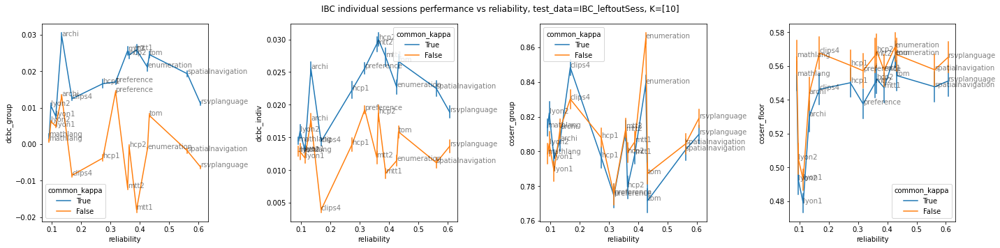

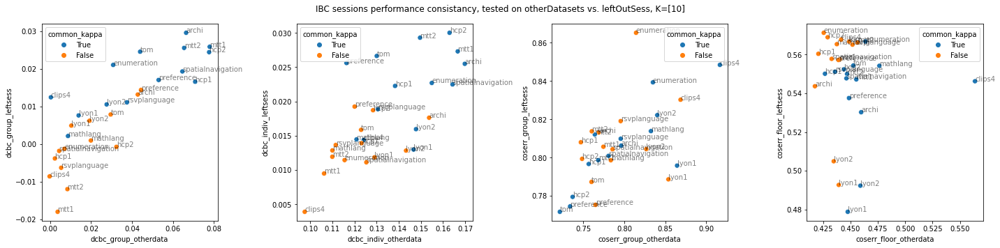

In [3]:
from ProbabilisticParcellation.scripts.modeling_3 import *
fname = f'/Models/Evaluation/eval_asym_train-Ib_twoSess_test-leftOutSess.tsv'
result_3_rel_check(fname, K=[10])
plot_IBC_performance_reliability(K=[10])

### Some example fusion maps

**Two relevant sessions**

Text(0.5, 0.98, 'Model 4, K=17, sessions= [archi, hcp1]')

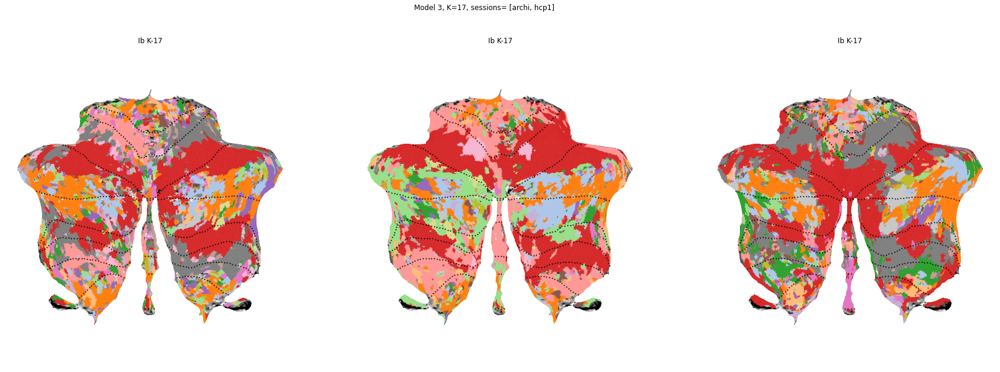

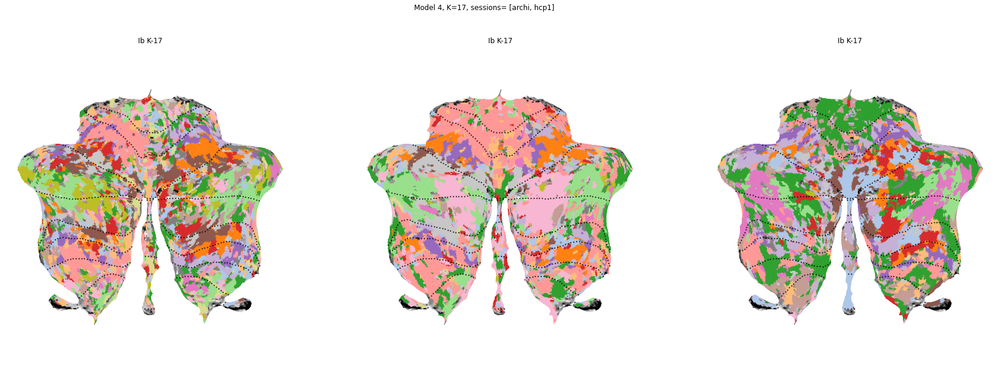

In [9]:
plt.figure(figsize=(30, 10))
plot_model_parcel(['Models_03/asym_Ib_space-MNISymC3_K-17_ses-archi',
                   'Models_03/asym_Ib_space-MNISymC3_K-17_ses-hcp1',
                   'Models_03/IBC_sessFusion/asym_Ib_space-MNISymC3_K-17_ses-spatialnavigation+tom'], 
                  [1,3], cmap='tab20', align=True, device='cuda')
plt.suptitle('Model 3, K=17, sessions= [archi, hcp1]')

plt.figure(figsize=(30, 10))
plot_model_parcel(['Models_04/asym_Ib_space-MNISymC3_K-17_ses-archi',
                   'Models_04/asym_Ib_space-MNISymC3_K-17_ses-hcp1',
                   'Models_04/IBC_sessFusion/asym_Ib_space-MNISymC3_K-17_ses-spatialnavigation+tom'], 
                  [1,3], cmap='tab20', align=True, device='cuda')
plt.suptitle('Model 4, K=17, sessions= [archi, hcp1]')

**Two irrelevant sessions**

Text(0.5, 0.98, 'Model 4, K=20, sessions= enumeration, mathlang')

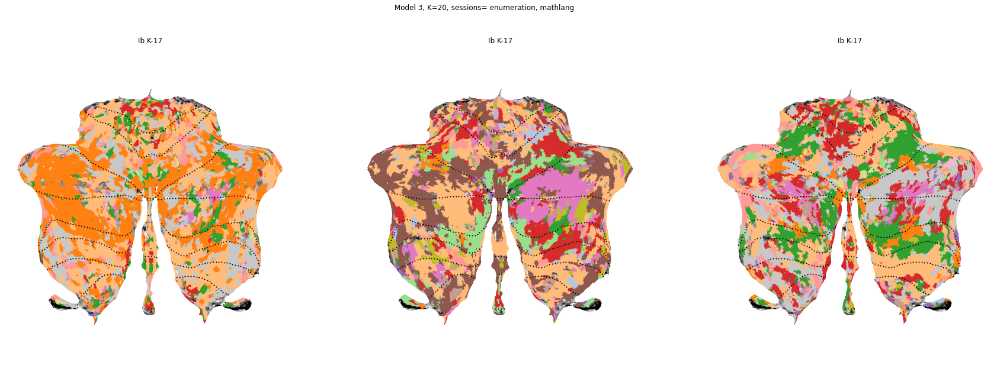

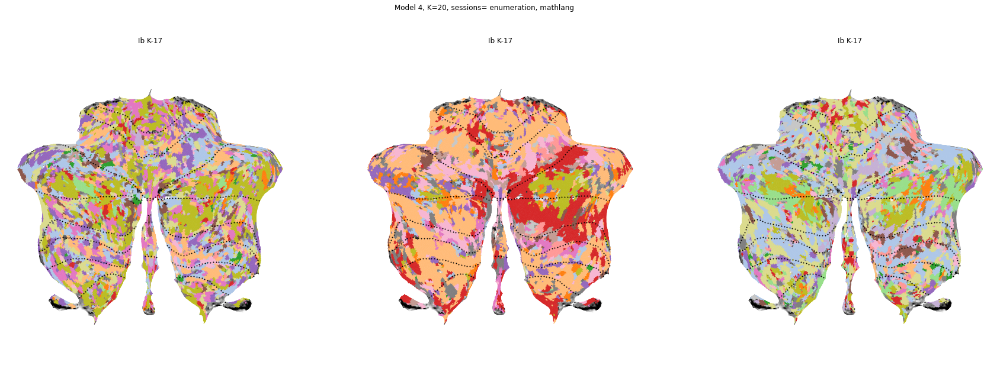

In [5]:
plt.figure(figsize=(30, 10))
plot_model_parcel(['Models_03/asym_Ib_space-MNISymC3_K-17_ses-enumeration',
                   'Models_03/asym_Ib_space-MNISymC3_K-17_ses-mathlang',
                   'Models_03/IBC_sessFusion/asym_Ib_space-MNISymC3_K-17_ses-enumeration+mathlang'], 
                  [1,3], cmap='tab20', align=True, device='cuda')
plt.suptitle('Model 3, K=20, sessions= enumeration, mathlang')

plt.figure(figsize=(30, 10))
plot_model_parcel(['Models_04/asym_Ib_space-MNISymC3_K-17_ses-enumeration',
                   'Models_04/asym_Ib_space-MNISymC3_K-17_ses-mathlang',
                   'Models_04/IBC_sessFusion/asym_Ib_space-MNISymC3_K-17_ses-enumeration+mathlang'], 
                  [1,3], cmap='tab20', align=True, device='cuda')
plt.suptitle('Model 4, K=20, sessions= enumeration, mathlang')

## 4. IBC 14 individual sessions vs. all sessions fusion (tested on other datasets)

First, we visualize the model fitting result of all individual sessions plus all sesisons fusion map. 

### Model 3

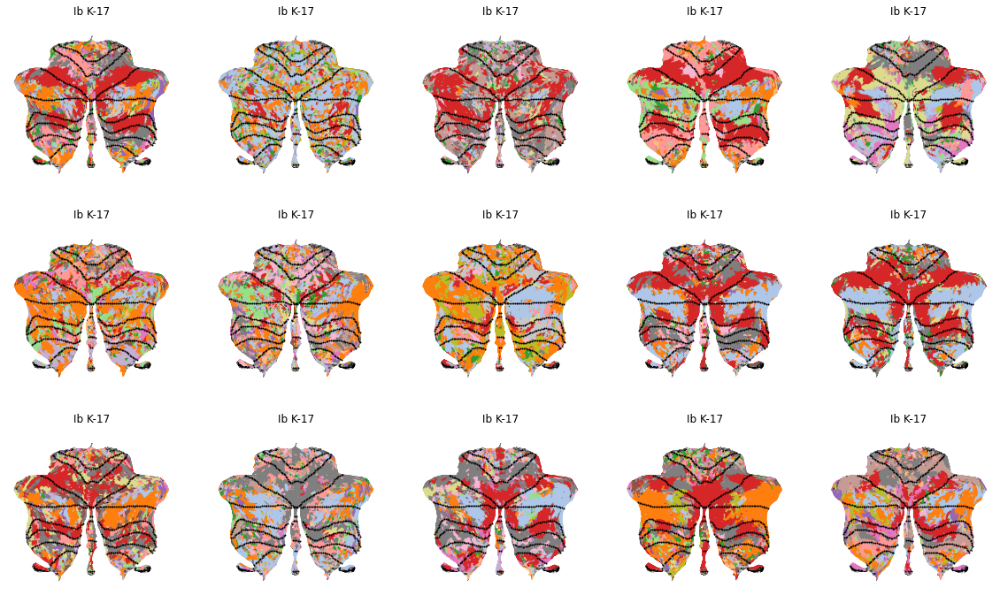

In [7]:
plt.figure(figsize=(20, 12))
sess = DataSetIBC(base_dir + '/IBC').sessions

model_names = [f'Models_03/asym_Ib_space-MNISymC3_K-17_{s}' for s in sess]
plot_model_parcel(model_names+[f'Models_03/asym_Ib_space-MNISymC3_K-17'],
                  [3,5], cmap='tab20', align=True, device='cuda')

### Model 4

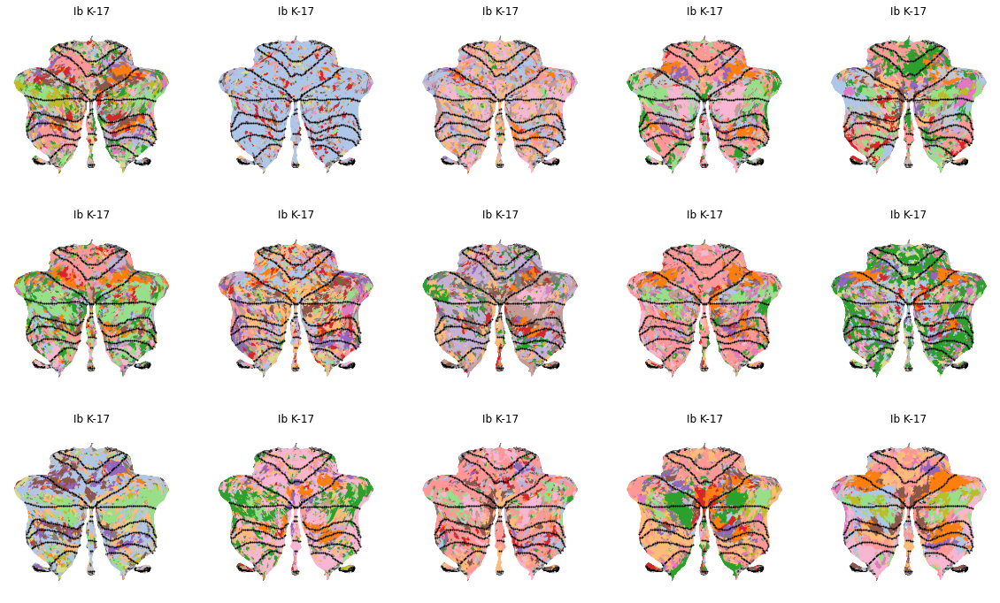

In [8]:
plt.figure(figsize=(20, 12))
sess = DataSetIBC(base_dir + '/IBC').sessions

model_names = [f'Models_04/asym_Ib_space-MNISymC3_K-17_{s}' for s in sess]
plot_model_parcel(model_names+[f'Models_04/asym_Ib_space-MNISymC3_K-17'],
                  [3,5], cmap='tab20', align=True, device='cuda')

### Individual sessions vs. sessions fusion tested on other clean datasets

**Averaged across K**

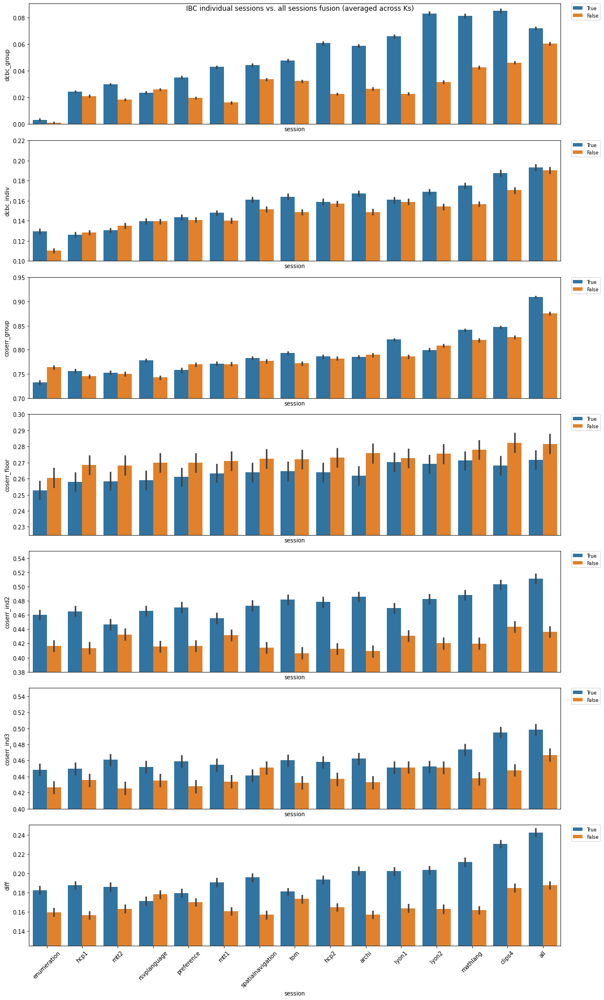

In [32]:
D = pd.read_csv(model_dir + '/Models/Evaluation/eval_all_asym_Ib_K-10_to_68_indivSess_on_otherDatasets.tsv',sep='\t')
orderby = None
D["diff"] = D['coserr_ind3']-D['coserr_floor']

plt.figure(figsize=(15,25))
crits = ['dcbc_group','dcbc_indiv','coserr_group','coserr_floor','coserr_ind2','coserr_ind3', 'diff']
for i, c in enumerate(crits):
    plt.subplot(7, 1, i + 1)
    if orderby is not None:
        order = D.loc[(D['common_kappa'] == True)].groupby('session')[c].mean().sort_values().keys().to_list()
    else:
        order = D.groupby('session')[c].mean().sort_values().keys().to_list()
    sb.barplot(data=D, x='session', y=c, order=order, hue='common_kappa',
               hue_order=[True, False], errorbar="se")
    if i == len(crits)-1:
        plt.xticks(rotation=45)
    else:
        plt.xticks([])
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')

    if c == 'dcbc_indiv':
        plt.ylim(0.1,0.22)
    elif c == 'coserr_group':
        plt.ylim(0.7,0.95)
    elif c== 'coserr_floor':
        plt.ylim(0.225, 0.30)
    elif c== 'coserr_ind2':
        plt.ylim(0.38, 0.55)
    elif c== 'coserr_ind3':
        plt.ylim(0.4, 0.55)
    elif c== 'diff':
        plt.ylim(0.125, 0.25)
#     if c == 'coserr_floor':
#         plt.ylim(0.4, 0.8)

plt.suptitle(f'IBC individual sessions vs. all sessions fusion (averaged across Ks)')
plt.tight_layout()

# ax = sb.barplot(data=D,y='dcbc_group',x='D',hue='common_kappa', hue_order=D["common_kappa"].unique())
# a=ax.set_xticklabels(ax.get_xticklabels(), rotation=45,horizontalalignment='right')

**Varying by K**

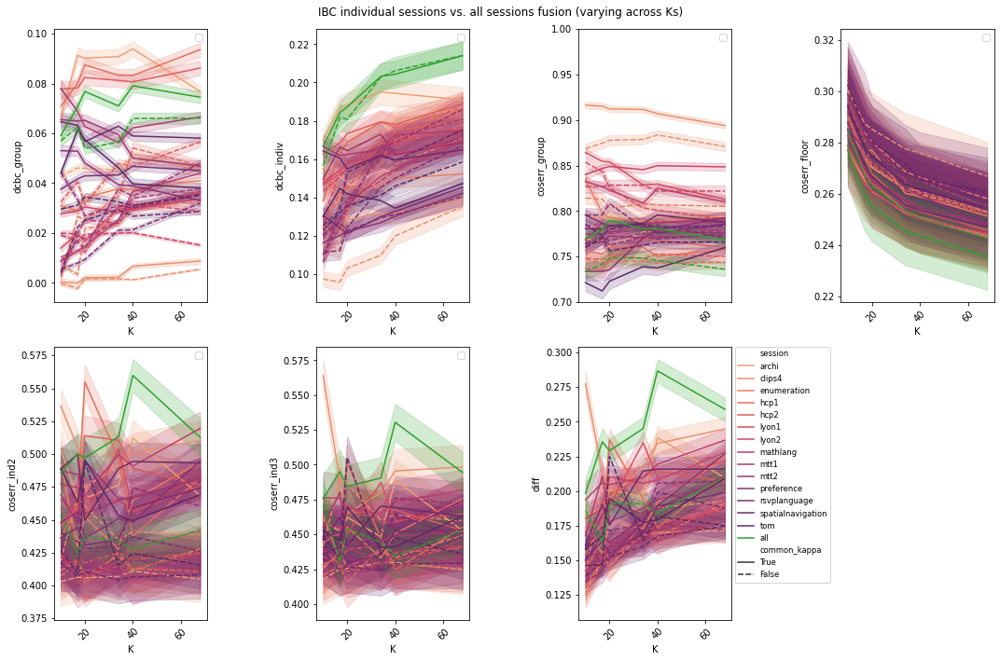

In [12]:
D = pd.read_csv(model_dir + '/Models/Evaluation/eval_all_asym_Ib_K-10_to_68_indivSess_on_otherDatasets.tsv',sep='\t')
D["diff"] = D['coserr_ind3']-D['coserr_floor']

plt.figure(figsize=(15,10))
crits = ['dcbc_group','dcbc_indiv','coserr_group','coserr_floor','coserr_ind2','coserr_ind3','diff']
for i, c in enumerate(crits):
    plt.subplot(2, 4, i + 1)
    sb.lineplot(data=D, x='K', y=c, hue='session', style='common_kappa', 
                style_order=[True, False], errorbar="se", palette=sb.color_palette("flare", 14)+[sb.color_palette()[2]])
    plt.xticks(rotation=45)
    if i == 6:
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    else:
        plt.legend([])
    if c == 'coserr_group':
        plt.ylim(0.7, 1.0)
#     if c == 'coserr_floor':
#         plt.ylim(0.4, 0.8)

plt.suptitle(f'IBC individual sessions vs. all sessions fusion (varying across Ks)')
plt.tight_layout()

## 5. All datasets fusion

### 1. Individual datasets vs. all datasets fusion tested on each individual datasets (Overfitting)

**Result is averaged across all K = [10,17,20,34,40,68]** and test datasets

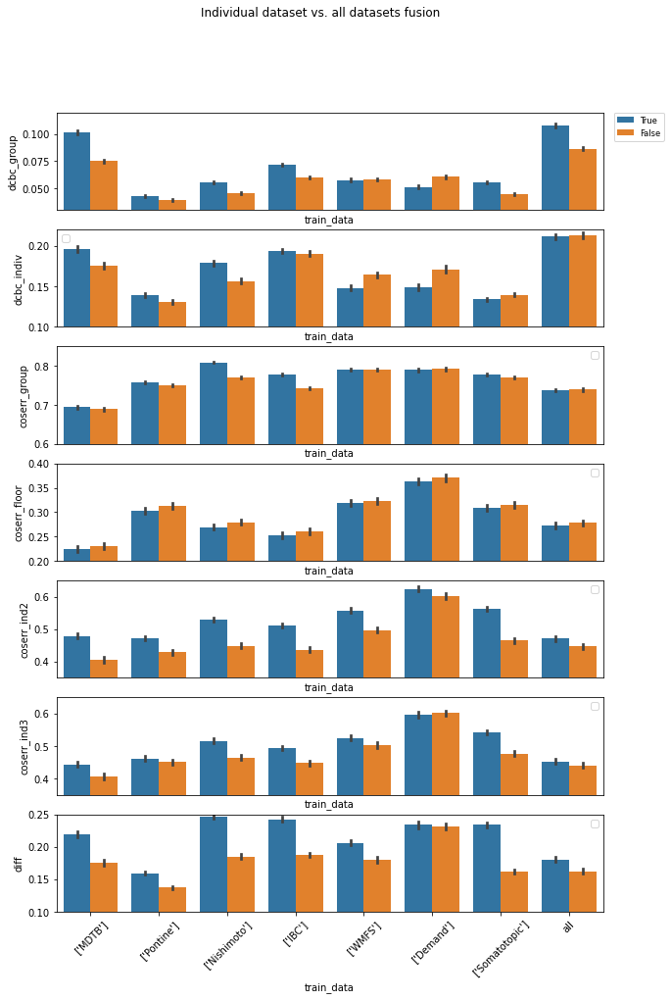

In [16]:
fname = f'/Models/Evaluation/eval_dataset7_asym.tsv'

D = pd.read_csv(model_dir + fname, delimiter='\t')
D['diff'] = D['coserr_ind3'] - D['coserr_floor']
D = D.replace("['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']", 'all')
crits = ['dcbc_group','dcbc_indiv','coserr_group',
         'coserr_floor','coserr_ind2','coserr_ind3','diff']

plt.figure(figsize=(10, 15))
for i, c in enumerate(crits):
    plt.subplot(7, 1, i + 1)
    sb.barplot(data=D, x='train_data', y=c, order=["['MDTB']", "['Pontine']", "['Nishimoto']", "['IBC']", 
                                                   "['WMFS']", "['Demand']","['Somatotopic']",
                                                   "all"],
               hue='common_kappa', hue_order=[True, False], errorbar="se")
    
    # plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    if c == 'dcbc_group':
        plt.ylim(0.03,0.12)
    elif c == 'dcbc_indiv':
        plt.ylim(0.1,0.22)
    elif c == 'coserr_group':
        plt.ylim(0.6,0.85)
    elif c== 'coserr_floor':
        plt.ylim(0.2, 0.4)
    elif c== 'coserr_ind2':
        plt.ylim(0.35, 0.65)
    elif c== 'coserr_ind3':
        plt.ylim(0.35, 0.65)
    elif c== 'diff':
        plt.ylim(0.1, 0.25)
        
    if i == len(crits)-1:
        plt.xticks(rotation=45)
    else:
        plt.xticks([])
    
    if i == 0:
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    else:
        plt.legend("")
    # if 'coserr' in c:
    #     plt.ylim(0.4, 1)

plt.suptitle(f'Individual dataset vs. all datasets fusion')
plt.show()

**Varying by K**

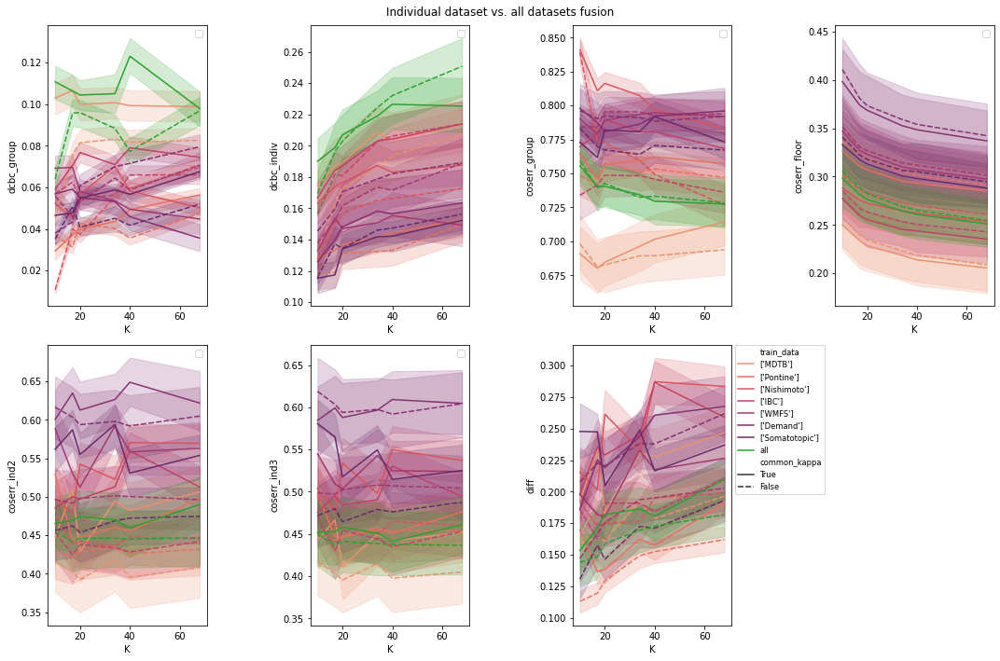

In [21]:
fname = f'/Models/Evaluation/eval_dataset7_asym.tsv'

D = pd.read_csv(model_dir + fname, delimiter='\t')
D['diff'] = D['coserr_ind3'] - D['coserr_floor']
crits = ['dcbc_group','dcbc_indiv','coserr_group',
         'coserr_floor','coserr_ind2','coserr_ind3','diff']
D = D.replace("['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']", 'all')

plt.figure(figsize=(15, 10))
for i, c in enumerate(crits):
    plt.subplot(2, 4, i + 1)
    sb.lineplot(data=D, x='K', y=c,hue="train_data", hue_order=["['MDTB']", "['Pontine']", "['Nishimoto']", "['IBC']", 
                                                                "['WMFS']", "['Demand']","['Somatotopic']",
                                                                "all"],
               style='common_kappa', style_order=[True, False], palette=sb.color_palette("flare", 7)+[sb.color_palette()[2]])
    
    # plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    if i == 6:
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    else:
        plt.legend("")
    # if 'coserr' in c:
    #     plt.ylim(0.4, 1)

plt.suptitle(f'Individual dataset vs. all datasets fusion')
plt.tight_layout()
plt.show()

### 2. Fusion (leave-one-dataset-out) tested on the leftout dataset

**Averaged across K**

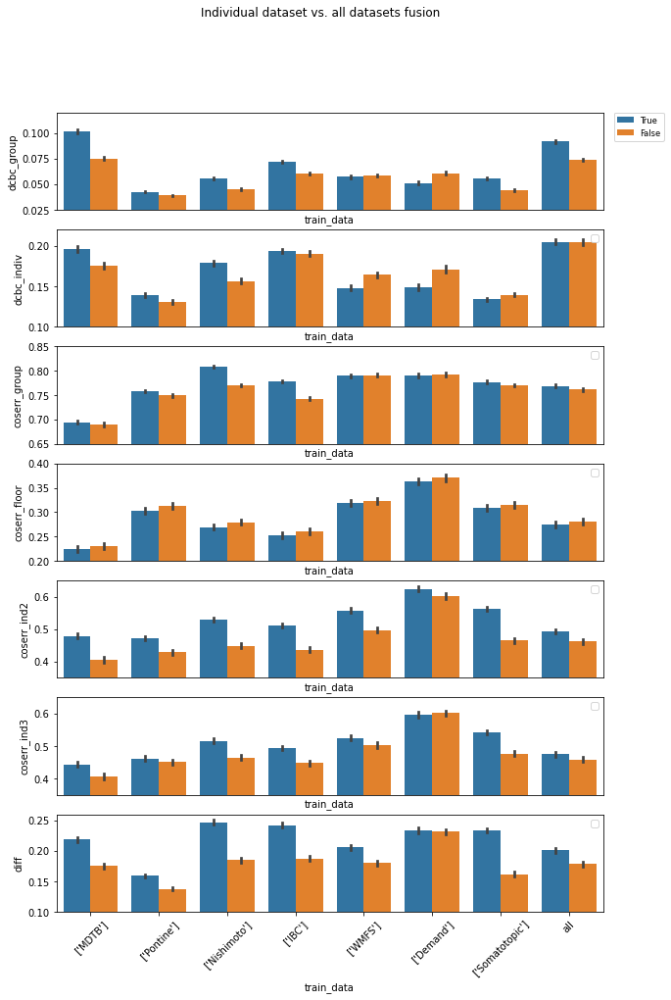

In [27]:
fname = f'/Models/Evaluation/eval_dataset7_asym.tsv'

indiv_datasets = ["['MDTB']","['Pontine']","['Nishimoto']","['IBC']","['WMFS']","['Demand']","['Somatotopic']"]

train_datasets = ["['Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'IBC' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'Nishimoto' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Somatotopic']",
                  "['MDTB', 'Pontine', 'Nishimoto', 'IBC', 'WMFS', 'Demand']"]
    
D = pd.read_csv(model_dir + fname, delimiter='\t')
D['diff'] = D['coserr_ind3'] - D['coserr_floor']
df = D.loc[(D['train_data'] != "['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']")]
df = df.replace(train_datasets,'all')

crits = ['dcbc_group','dcbc_indiv','coserr_group',
         'coserr_floor','coserr_ind2','coserr_ind3', 'diff']

plt.figure(figsize=(10, 15))
for i, c in enumerate(crits):
    plt.subplot(7, 1, i + 1)
    sb.barplot(data=df, x='train_data', order=indiv_datasets+['all'],
               y=c, hue='common_kappa', hue_order=[True, False], errorbar="se")
    
    # plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    if i == len(crits)-1:
        plt.xticks(rotation=45)
    else:
        plt.xticks([])
    
    if c == 'dcbc_group':
        plt.ylim(0.025,0.12)
    elif c == 'dcbc_indiv':
        plt.ylim(0.1,0.22)
    elif c == 'coserr_group':
        plt.ylim(0.65,0.85)
    elif c== 'coserr_floor':
        plt.ylim(0.2, 0.4)
    elif c== 'coserr_ind2':
        plt.ylim(0.35, 0.65)
    elif c== 'coserr_ind3':
        plt.ylim(0.35, 0.65)
    elif c== 'diff':
        plt.ylim(0.1, 0.26)
    
    if i == 0:
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    else:
        plt.legend("")
    # if 'coserr' in c:
    #     plt.ylim(0.4, 1)

plt.suptitle(f'Individual dataset vs. all datasets fusion')
plt.show()

**Varying by Ks**

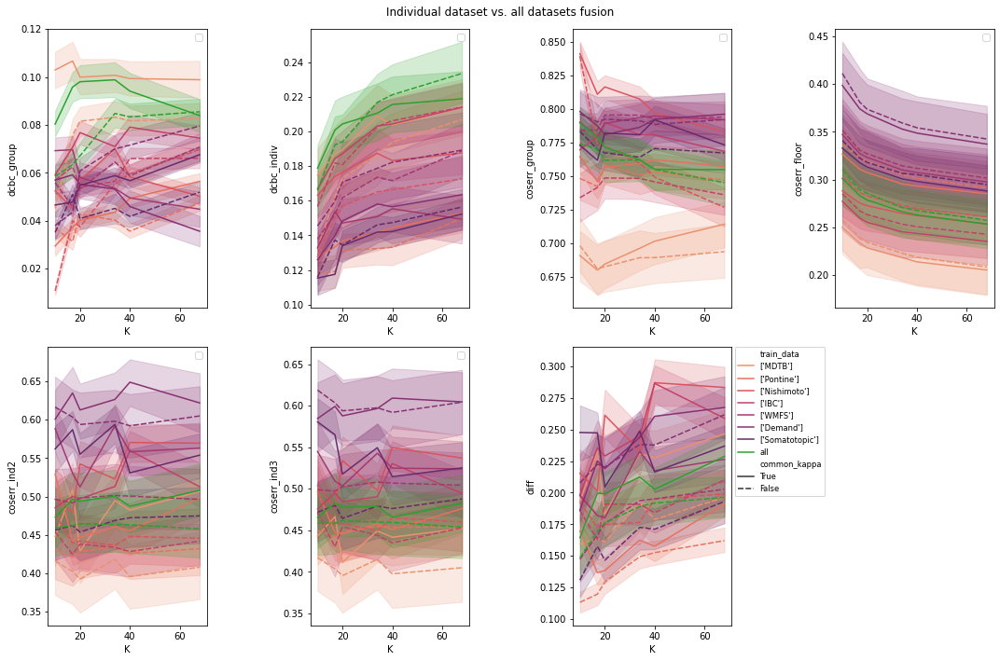

In [30]:
fname = f'/Models/Evaluation/eval_dataset7_asym.tsv'

indiv_datasets = ["['MDTB']","['Pontine']","['Nishimoto']","['IBC']","['WMFS']","['Demand']","['Somatotopic']"]

train_datasets = ["['Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'IBC' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'Nishimoto' 'WMFS' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'Demand' 'Somatotopic']",
                  "['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Somatotopic']",
                  "['MDTB', 'Pontine', 'Nishimoto', 'IBC', 'WMFS', 'Demand']"]
    
D = pd.read_csv(model_dir + fname, delimiter='\t')
D['diff'] = D['coserr_ind3'] - D['coserr_floor']
df = D.loc[(D['train_data'] != "['MDTB' 'Pontine' 'Nishimoto' 'IBC' 'WMFS' 'Demand' 'Somatotopic']")]
df = df.replace(train_datasets,'all')

crits = ['dcbc_group','dcbc_indiv','coserr_group',
         'coserr_floor','coserr_ind2','coserr_ind3','diff']

plt.figure(figsize=(15, 10))
for i, c in enumerate(crits):
    plt.subplot(2, 4, i + 1)
    sb.lineplot(data=df, x='K', hue='train_data', hue_order=indiv_datasets+['all'],
               y=c, style='common_kappa', style_order=[True, False], palette=sb.color_palette("flare", 7)+[sb.color_palette()[2]])
    
    # plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    if i == 6:
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, fontsize='small')
    else:
        plt.legend("")
    # if 'coserr' in c:
    #     plt.ylim(0.4, 1)

plt.suptitle(f'Individual dataset vs. all datasets fusion')
plt.tight_layout()
plt.show()

### Example maps

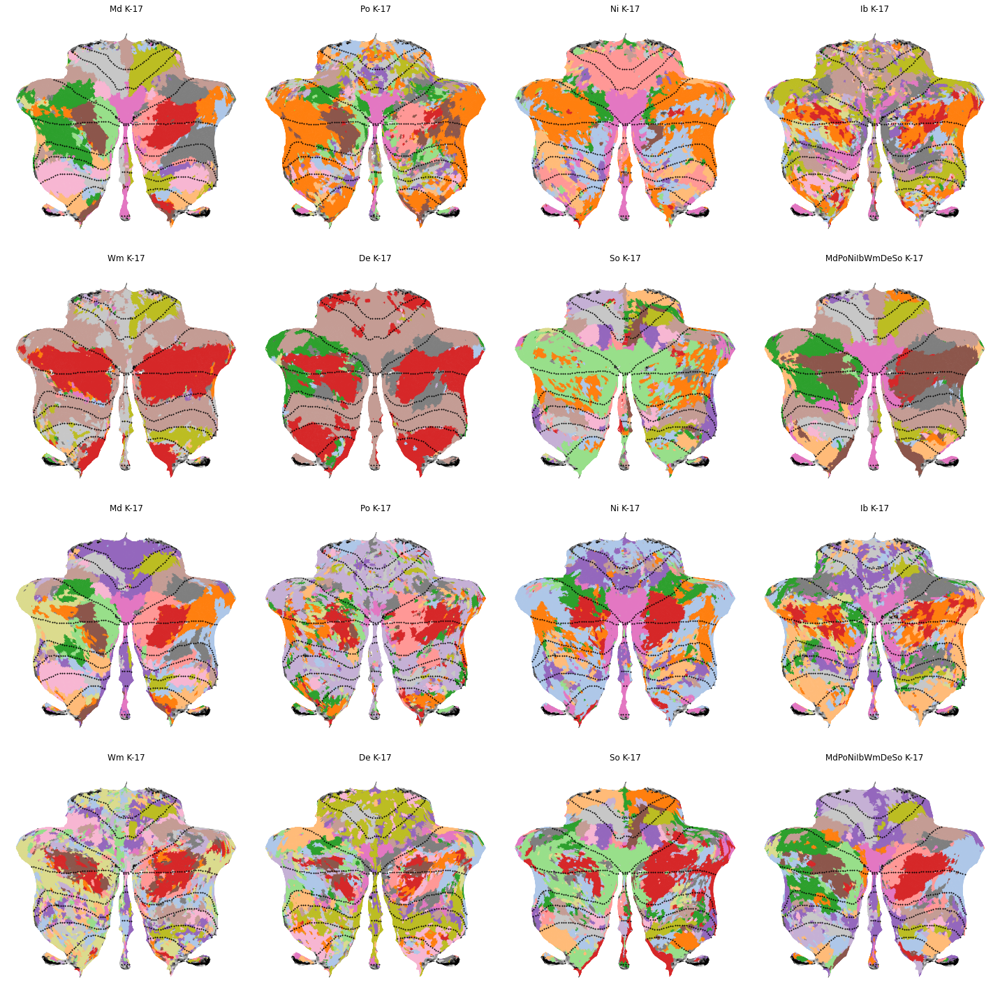

In [32]:
plt.figure(figsize=(20, 20))
datasets = ['Md','Po','Ni','Ib','Wm','De','So']

model_names = [f'Models_03/asym_{s}_space-MNISymC3_K-17' for s in datasets]
model_names += [f'Models_03/asym_MdPoNiIbWmDeSo_space-MNISymC3_K-17']
model_names += [f'Models_04/asym_{s}_space-MNISymC3_K-17' for s in datasets]
model_names += [f'Models_04/asym_MdPoNiIbWmDeSo_space-MNISymC3_K-17']

plot_model_parcel(model_names, [4,4], cmap='tab20', align=True, device='cuda')
plt.tight_layout()

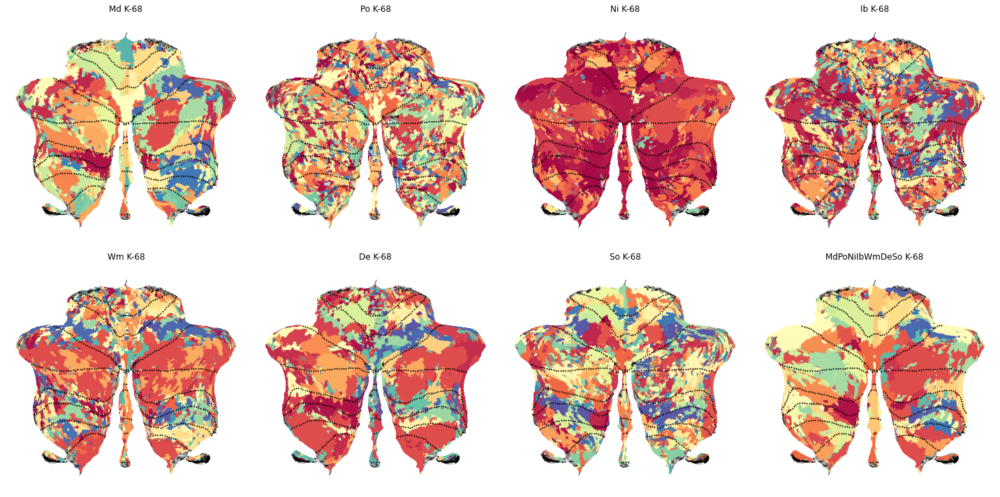

In [25]:
plt.figure(figsize=(20, 10))
datasets = ['Md','Po','Ni','Ib','Wm','De','So']
import matplotlib
cmap = matplotlib.cm.get_cmap('Spectral')
colors = cmap(np.linspace(0,1,69))

model_names = [f'Models_03/asym_{s}_space-MNISymC3_K-68' for s in datasets]
model_names += [f'Models_03/asym_MdPoNiIbWmDeSo_space-MNISymC3_K-68']
# model_names += [f'Models_04/asym_{s}_space-MNISymC3_K-34' for s in datasets]
# model_names += [f'Models_04/asym_MdPoNiIbWmDeSo_space-MNISymC3_K-34']

plot_model_parcel(model_names, [2,4], cmap=colors, align=True, device='cuda')
plt.tight_layout()